# AOMA long term with reference based Cov-SSI from STRID package

In [22]:
import numpy as np
import h5py
import matplotlib.pyplot as plt
from scipy import signal
import dataloader_halogaland.dataloader as dl
from dataloader_halogaland.plot import welch_plot, stabilization_diagram
import os
import koma.oma, koma.plot
import koma.clustering
import strid
from time import time
import pandas as pd
from datetime import datetime, timedelta
import warnings

In [23]:
np.warnings.filterwarnings('ignore', category=np.VisibleDeprecationWarning)
warnings.filterwarnings('ignore', category=RuntimeWarning)

In [24]:
analysis_length = 30 #minutes
cutoff_frequency = 1 #Hz
bridgedeck_only = True

loader= dl.HDF5_dataloader(os.getcwd()+'/../../../../../../../Volumes/LaCie/Halogaland_sixth_try.hdf5', bridgedeck_only=bridgedeck_only)

In [25]:
#Parameters
i = 50 #number of block rows
s = 6
fs = 2
orders = np.arange(2, 100+2, 2) #orders to perform system
stabcrit = {'freq': 0.05, 'damping': 0.1, 'mac': 0.1} # Default

if bridgedeck_only:
    ix_references_y = (np.array([0, 2, 4, 6, 8, 10, 12, 14])+16)
    ix_references_z = (np.array([0, 2, 4, 6, 8, 10, 12, 14])+32)
    ix_references = np.concatenate((ix_references_y, ix_references_z)).tolist()
else:
    ix_references_y = (np.array([1,3,5,7,11,13,17,19])+22)
    ix_references_z = (np.array([1,3,5,7,11,13,17,19])+44)
    ix_references = np.concatenate((ix_references_y, ix_references_z)).tolist()

In [26]:
number_of_periods = len(loader.periods)
print("Number of perdiods to run " + str(number_of_periods))
freq_modes = []
number_in_sample = fs*60*analysis_length

Number of perdiods to run 88


One or more channels are missing, period skipped.
One or more channels are missing, period skipped.
One or more channels are missing, period skipped.
One or more channels are missing, period skipped.
One or more channels are missing, period skipped.
One or more channels are missing, period skipped.
One or more channels are missing, period skipped.
One or more channels are missing, period skipped.
One or more channels are missing, period skipped.
One or more channels are missing, period skipped.
One or more channels are missing, period skipped.
One or more channels are missing, period skipped.
Cov-SSI executed in 1.5794150829315186
HDBSCAN executed in 0.03998398780822754
Post processing executed in 0.030888080596923828
Stabilization diagram executed in 0.19083285331726074
Wind statistics executed in 0.027104854583740234
Time serie 1 of 16 done in 2.0471160411834717 sec. Period 13 of 88 done. Number of skipped periods: 12.
Cov-SSI executed in 1.24853515625
HDBSCAN executed in 0.040084123

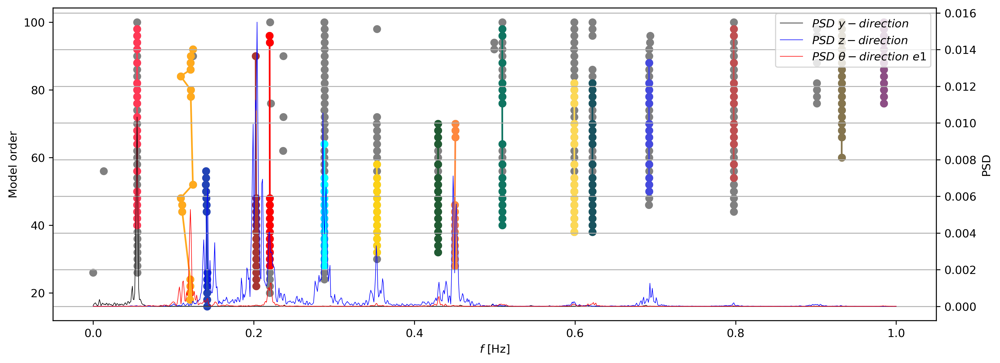

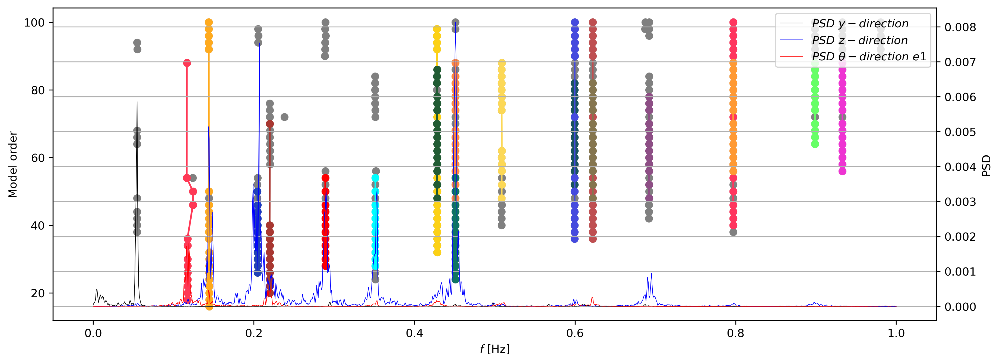

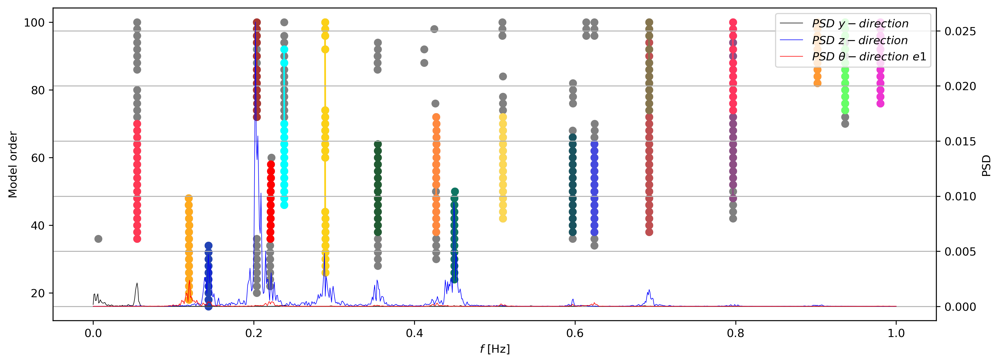

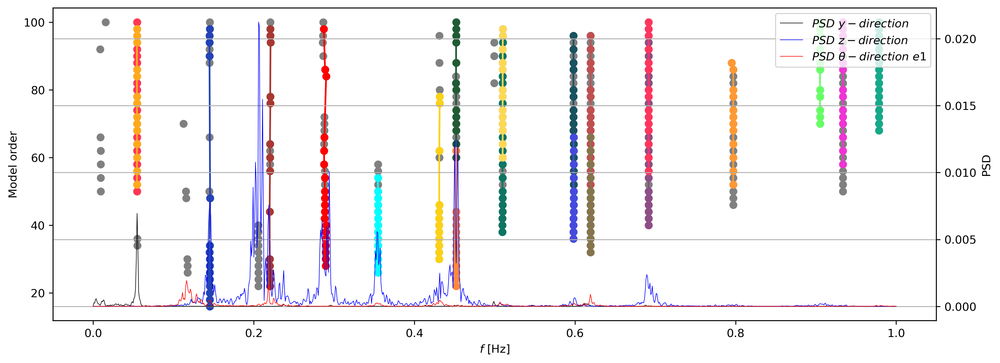

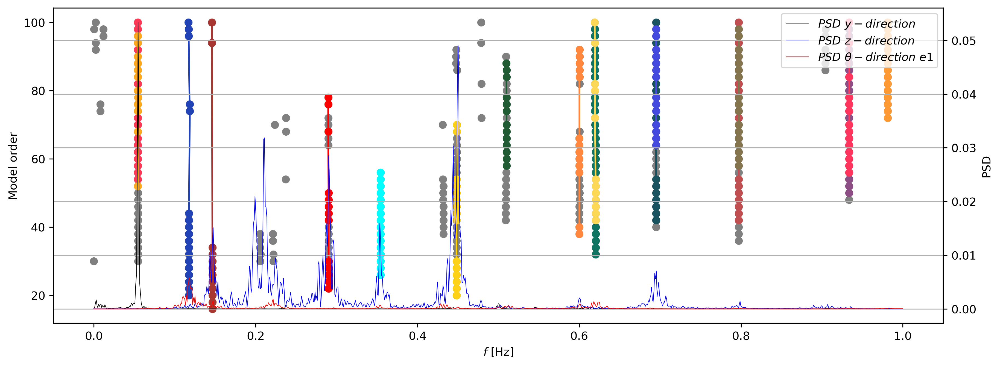

...

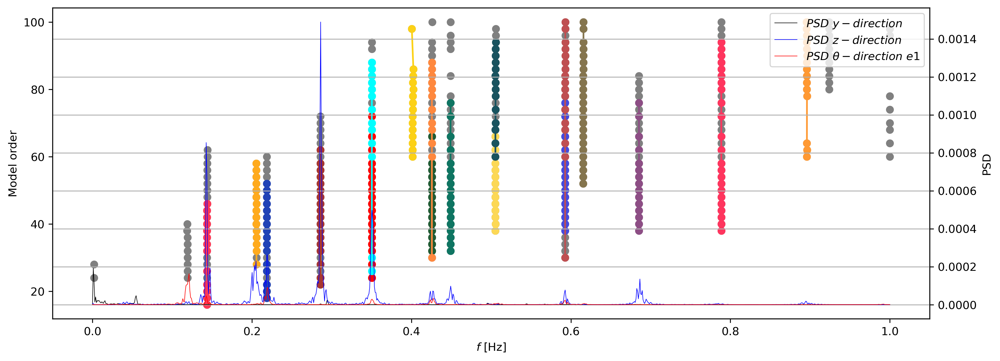

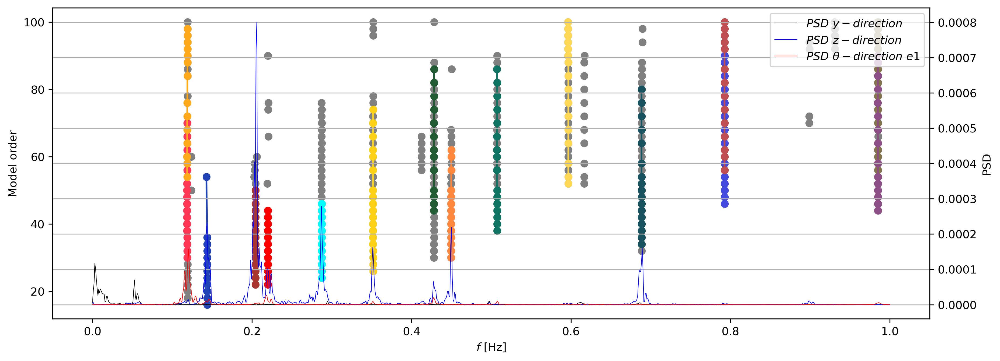

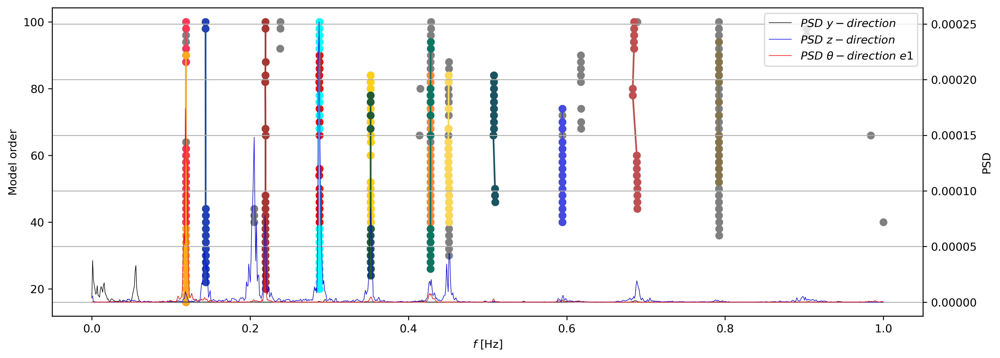

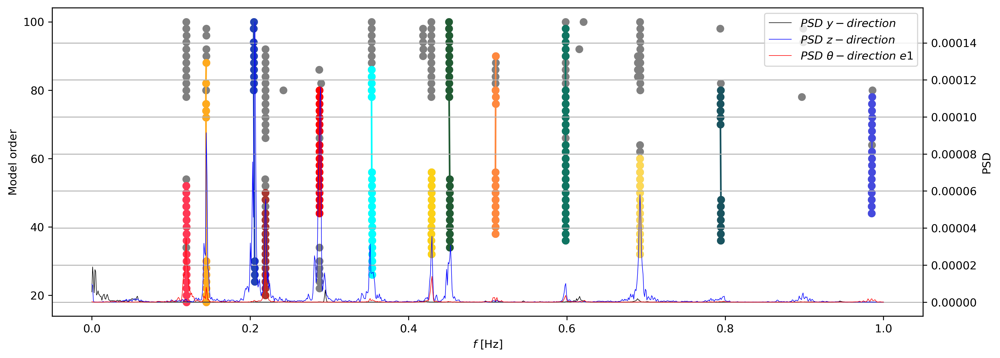

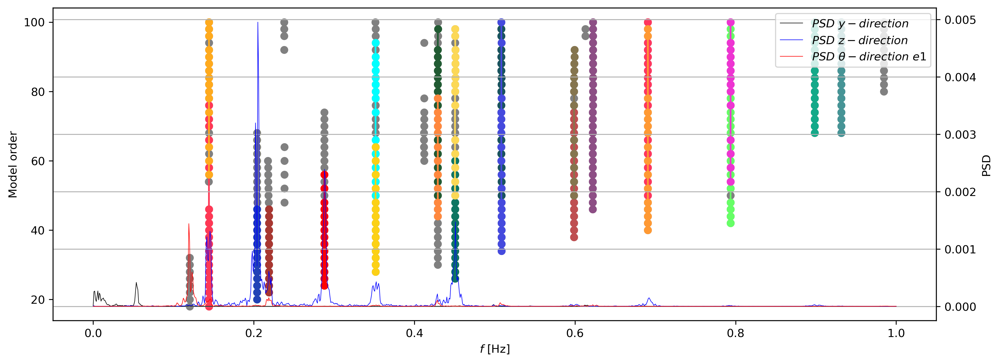

In [27]:
skipped = 0
for period in range(number_of_periods-44):
    #remove 10 periods and start at the 10th period
    acc = loader.load_all_acceleration_data(loader.periods[period], preprosess=True, cutoff_frequency=cutoff_frequency, filter_order=10)

    #print(type(acc))
    #If all channels are present, proceed with split up in intervals and perform Cov-SSI and clustering, if not, move to the next period
    if isinstance(acc, np.ndarray):
        acc = np.array_split(acc, acc.shape[0]/number_in_sample)
        #print(len(acc))

        for j in range(len(acc)-15): #add -15 here for testing

            t0 = time() #Start timer of computation process

            t0_cov = time()
            #Cov-SSI call
            ssid = strid.CovarianceDrivenStochasticSID(acc[j].transpose(), fs, ix_references)
            modes = {}
            for order in orders:
                A, C, G, R0 = ssid.perform(order, i)
                modes[order] = strid.Mode.find_modes_from_ss(A, C, ssid.fs)

            #Sorting routine
            #orders = []
            lambdas = []
            phis = []

            for order in modes.keys():
                modes_in_order = modes[order]
                lambdas_in_order = []
                phis_in_order = []
                for mode in modes_in_order:
                    #orders.append(order)
                    lambdas_in_order.append(mode.eigenvalue)
                    phis_in_order.append(mode.eigenvector)
                #print("lambdas: " + str(lambdas_in_order))
                #print("phis: " + str(phis_in_order))
                lambdas.append(np.array(lambdas_in_order))
                phis.append(np.array(phis_in_order).transpose())

            t1_cov = time()
            print("Cov-SSI executed in " + str(t1_cov - t0_cov))

            #Find stable poles routine from KOMA package here -> doesn't quite work yet
            lambd_stab, phi_stab, orders_stab, idx_stab = koma.oma.find_stable_poles(lambdas, phis, orders, s, stabcrit=stabcrit, valid_range={'freq': [0, np.inf], 'damping':[0, np.inf]}, indicator='freq', return_both_conjugates=False)

            t0_hdbscan = time()
            #Pole clustering
            pole_clusterer = koma.clustering.PoleClusterer(lambd_stab, phi_stab, orders_stab, min_cluster_size=10, min_samples=10, scaling={'mac':1.0, 'lambda_real':1.0, 'lambda_imag': 1.0})
            prob_threshold = 0.5   #probability of pole to belong to cluster, based on estimated "probability" density function
            args = pole_clusterer.postprocess(prob_threshold=prob_threshold, normalize_and_maxreal=True)

            xi_auto, omega_n_auto, phi_auto, order_auto, probs_auto, ixs_auto = koma.clustering.group_clusters(*args)

            xi_mean = np.array([np.median(xi_i) for xi_i in xi_auto])
            fn_mean = np.array([np.median(om_i) for om_i in omega_n_auto])/2/np.pi

            xi_std = np.array([np.std(xi_i) for xi_i in xi_auto])
            fn_std = np.array([np.std(om_i) for om_i in omega_n_auto])/2/np.pi
            t1_hdbscan = time()
            print("HDBSCAN executed in " + str(t1_hdbscan - t0_hdbscan))

            t0_sort = time()
            #Sort and arrange modeshapes
            # Group only a selected quantity (e.g. indices)
            lambd_used, phi_used, order_stab_used, group_ixs, all_single_ix, probs = pole_clusterer.postprocess(prob_threshold=prob_threshold)

            grouped_phis = koma.clustering.group_array(phi_used, group_ixs, axis=1)

            phi_extracted = np.zeros((len(grouped_phis), len(loader.acceleration_sensors)*3))

            for a in range(len(grouped_phis)):
                for b in range(np.shape(grouped_phis[a])[0]):
                   phi_extracted[a,b] = (np.real(np.median(grouped_phis[a][b])))
            t1_sort = time()
            print("Post processing executed in " + str(t1_sort - t0_sort))

            t0_stab = time()
            #Save stabilization plot
            stab_diag = stabilization_diagram(acc[j], fs, 2, (np.array(omega_n_auto)/2/np.pi), np.array(order_auto), all_freqs=np.abs(lambd_stab)/2/np.pi, all_orders=orders_stab)
            plt.savefig("plots/stab_diag/stabilization_diagram_" + str(period+1) + "_" + str(j+1) + ".jpg")
            t1_stab = time()
            print("Stabilization diagram executed in " + str(t1_stab - t0_stab))

            freq_modes.append([freq for freq in fn_mean])

            t0_wind = time()
            #Load statistical data for analyzed time series
            mean_wind_speed, max_wind_speed = loader.load_wind_stat_data(loader.periods[period], analysis_length, j)
            mean_temp = loader.load_temp_stat_data(loader.periods[period],analysis_length, j)
            t1_wind = time()
            print("Wind statistics executed in " + str(t1_wind - t0_wind))

            t1 = time() #end timer of computation process
            print("Time serie " + str(j+1) + " of " + str(len(acc)) + " done in " + str(t1-t0) + " sec. Period " + str(period+1) + " of " + str(number_of_periods) + " done. Number of skipped periods: " + str(skipped)+".")

            #Prepare timestamp of the time series in process
            timestamp = (datetime.strptime(loader.periods[period], "%Y-%m-%d-%H-%M-%S") + timedelta(minutes=j*analysis_length)).strftime("%Y-%m-%d-%H-%M-%S")

            #Write results to h5 file
            #res_data = np.vstack([fn_mean, 100*xi_mean]).T
            with h5py.File(os.getcwd() + '/results/output_AOMA.h5', 'a') as hdf:
                G1 = hdf.create_group(timestamp)

                #Write results
                G1.create_dataset('Frequencies', data=fn_mean)
                G1.create_dataset('Damping', data=xi_mean)
                G1.create_dataset('Modeshape', data=phi_extracted)

                #Write attributes
                G1.attrs['Mean wind speed'] = mean_wind_speed
                G1.attrs['Max wind speed'] = max_wind_speed
                G1.attrs['Mean temp'] = mean_temp
                G1.attrs['Execution time'] = (t1-t0)
                G1.attrs['Std of acceleration data'] = np.mean(np.std(acc[j], axis=0))

    else:
        skipped += 1
        print("One or more channels are missing, period skipped.")